In [2]:
import pandas as pd, numpy as np, os
import matplotlib.pyplot as plt
import matplotlib.backends.backend_pdf
from matplotlib.backends.backend_pdf import PdfPages

In [3]:
output_dir = '/mnt/share/costeffectiveness/results/vivarium_ciff_sam/v7.0.0_full_model_no_x_factor/ciff_sam/2022_03_04_17_34_48/count_data/'

In [4]:
pd.read_csv(output_dir + 'wasting_transition_count.csv').age.unique()

array(['early_neonatal', 'late_neonatal', '1-5_months', '6-11_months',
       '12_to_23_months', '2_to_4'], dtype=object)

In [5]:
scenarios = ['baseline',
             'sam_treatment',
             'mam_treatment',
             'sqlns',
             'lbwsg_interventions',
             'zinc_supplementation']
scenario_names = ['Baseline',
                  'SAM treatment',
                 'MAM treatment',
                 'SQ-LNS',
                 'LBWSG interventions',
                 'Zinc supplementation']
scenario_colors = ['tab:blue',
                  'tab:orange',
                  'tab:green',
                  'tab:red',
                  'tab:purple',
                  'tab:brown']
scenario_order = pd.DataFrame()
scenario_order['scenario'] = scenarios
scenario_order['order'] = list(range(0,len(scenarios)))
scenario_order

,scenario,order
0,baseline,0
1,sam_treatment,1
2,mam_treatment,2
3,sqlns,3
4,lbwsg_interventions,4
5,zinc_supplementation,5


In [6]:
def calculate_wasting_values(output_dir, ages, strata_cols, measure, metric, 
                             relative_scenario):
    if measure=='prevalence':
        data = pd.read_csv(output_dir + 'wasting_state_person_time.csv').drop(columns=['Unnamed: 0'])
        wasted = data.loc[data.cause.str.contains('acute_malnutrition')]
        wasted['cause'] = 'wasted'
        wasted = (wasted.groupby([c for c in wasted.columns if c != 'value']).sum())
        data = pd.concat([data,wasted.reset_index()],ignore_index=True)
    elif measure=='incidence':
        data = (pd.read_csv(output_dir + 'wasting_transition_count.csv')
                .drop(columns=['Unnamed: 0']).rename(columns={'measure':'cause'}))
        wasted = data.loc[data.cause.isin(['mild_child_wasting_to_moderate_acute_malnutrition_event_count',
                                          'moderate_acute_malnutrition_to_severe_acute_malnutrition_event_count'])]
        wasted['cause'] = 'wasted'
        total_mam = data.loc[data.cause.isin(['mild_child_wasting_to_moderate_acute_malnutrition_event_count',
                                             'severe_acute_malnutrition_to_moderate_acute_malnutrition_event_count'])]
        total_mam['cause'] = 'total_mam'
        wasted = pd.concat([wasted,total_mam])
        wasted = (wasted.groupby([c for c in wasted.columns if c != 'value']).sum())
        data = pd.concat([data,wasted.reset_index()],ignore_index=True)
        pt = pd.read_csv(output_dir + 'wasting_state_person_time.csv').drop(columns=['Unnamed: 0'])
        groupby_cols = ['input_draw','scenario','cause']
    data = data.loc[data.age.isin(ages)]    
    data = data.groupby(['input_draw','scenario'] + strata_cols + ['cause']).sum()
    if measure=='prevalence':
        data = data / data.groupby(['input_draw','scenario'] + strata_cols).sum() * 100
    else:
        pt = pt.loc[pt.age.isin(ages)].groupby(['input_draw','scenario'] + strata_cols).sum()
        data = data / pt * 100_000     
    #if metric=='value':
    #    data = (data.groupby(['scenario','cause'] + strata_cols)
    #                .describe(percentiles=[0.025,0.975]))
    if metric != 'value':
        data_baseline = (data.reset_index().loc[data.reset_index().scenario==relative_scenario]
                   .set_index(['input_draw','cause'] + strata_cols)
                   .drop(columns='scenario'))
        if metric=='percent_reduction':
            data = ((data_baseline - data.reset_index().set_index(['input_draw','cause'] + strata_cols + ['scenario']))
                    / data_baseline) * 100
        elif metric=='absolute_reduction':
            data = data_baseline - data.reset_index().set_index(['input_draw','cause'] + strata_cols + ['scenario'])
            
        #data = (data.reset_index().groupby(['scenario','cause'] + strata_cols)
        #        .describe(percentiles=[0.025,0.975])).drop(columns='input_draw')
    data = data.reset_index().merge(scenario_order, on='scenario').sort_values(by='order')
    data = (data.groupby(['scenario','cause'] + strata_cols)
                    .describe(percentiles=[0.025,0.975]))[['value']]
    return data.reset_index()

In [7]:
def format_2026_table(measure, metric, relative_scenario):
    t = calculate_wasting_values(output_dir, ages, ['year'], measure, metric, relative_scenario)
    t = t.loc[(t.year==2026)]
    if measure=='incidence':
        t = t.loc[(t.cause.isin(['mild_child_wasting_to_moderate_acute_malnutrition_event_count',
                            'moderate_acute_malnutrition_to_severe_acute_malnutrition_event_count']))]
    t['result'] = (t['value','mean'].round(1).astype(str)
                  + ' ('
                  + t['value','2.5%'].round(1).astype(str)
                  + ', '
                  + t['value','97.5%'].round(1).astype(str)
                  + ')')
    t = t.set_index(['scenario','cause']).unstack()[['result']].reset_index()
    t['scenario_order'] = np.where(t.scenario=='baseline',0,
                                  np.where(t.scenario=='sam_treatment',1,
                                          np.where(t.scenario=='mam_treatment',2,
                                                  np.where(t.scenario=='sqlns',3,
                                                          np.where(t.scenario=='lbwsg_interventions',4,5)))))
    t = t.sort_values(by='scenario_order').drop(columns='scenario_order')
    return t

In [8]:
six_to_59_ages = ['6-11_months',
       '12_to_23_months', '2_to_4']
ages = ['6-11_months',
       '12_to_23_months', '2_to_4']

## Finding 1: cross sectional prevalence

In [9]:
format_2026_table('prevalence', 'value', 'baseline')

<ipython-input-6-bd32712bcfec>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'


scenario             result                              \
                                                                             
cause                       mild_child_wasting moderate_acute_malnutrition   
0                  baseline  19.1 (18.7, 20.0)              6.7 (6.3, 6.9)   
3             sam_treatment  19.4 (19.0, 20.4)              6.5 (6.1, 6.8)   
2             mam_treatment  20.0 (19.5, 21.0)              5.8 (5.3, 6.1)   
4                     sqlns  20.4 (19.8, 21.5)              5.1 (4.7, 5.2)   
1       lbwsg_interventions  20.4 (19.8, 21.5)              5.0 (4.7, 5.2)   
5      zinc_supplementation  20.0 (19.3, 21.5)              4.7 (4.4, 4.8)   

                                                                              
                                                                              
cause severe_acute_malnutrition susceptible_to_child_wasting          wasted  
0                1.6 (1.5, 1.7)            64.3 (63.9, 64.7)  8.3 (7.8, 8.6)  
3                1.3 (1.2, 1.4)            64.9 (64.4, 65.3)  7.8 (7.3, 8.2)  
2                1.2 (1.1, 1.3)            66.1 (65.5, 66.7)  7.0 (6.4, 7.4)  
4                1.1 (1.0, 1.2)            67.4 (66.9, 67.8)  6.1 (5.7, 6.4)  
1                1.1 (1.0, 1.2)            67.4 (67.0, 67.8)  6.1 (5.7, 6.4)  
5                1.0 (0.9, 1.1)            68.7 (67.5, 69.5)  5.7 (5.4, 5.8)

In [10]:
format_2026_table('prevalence', 'percent_reduction', 'baseline')

<ipython-input-6-bd32712bcfec>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'


scenario             result                              \
                                                                             
cause                       mild_child_wasting moderate_acute_malnutrition   
0                  baseline     0.0 (0.0, 0.0)              0.0 (0.0, 0.0)   
3             sam_treatment  -1.5 (-2.0, -1.2)              2.6 (1.1, 4.7)   
2             mam_treatment  -4.4 (-5.1, -3.8)           14.1 (12.0, 17.2)   
4                     sqlns  -6.5 (-7.3, -5.2)           24.6 (21.8, 27.5)   
1       lbwsg_interventions  -6.5 (-7.3, -5.3)           24.8 (22.1, 27.7)   
5      zinc_supplementation  -4.5 (-7.4, -2.3)           30.5 (27.2, 33.6)   

                                                              \
                                                               
cause severe_acute_malnutrition susceptible_to_child_wasting   
0                0.0 (0.0, 0.0)               0.0 (0.0, 0.0)   
3             17.6 (13.2, 21.2)            -1.0 (-1.4, -0.7)   
2             25.0 (21.0, 29.0)            -2.9 (-3.5, -2.4)   
4             32.3 (27.8, 35.7)            -4.8 (-5.5, -4.0)   
1             32.8 (28.3, 36.2)            -4.9 (-5.6, -4.0)   
5             37.2 (34.3, 40.4)            -6.9 (-7.7, -4.9)   

                          
                          
cause             wasted  
0         0.0 (0.0, 0.0)  
3         5.5 (4.1, 7.8)  
2      16.2 (14.2, 19.4)  
4      26.1 (23.4, 28.9)  
1      26.4 (23.7, 29.2)  
5      31.8 (28.7, 34.8)

<ipython-input-51-bd32712bcfec>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'
<ipython-input-51-bd32712bcfec>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'


Text(1.5, 2.7, 'Simulated intervention impacts on acute malnutrition\ncross-sectional exposure among children six to 59 months\n(with 95% uncertainty intervals)')

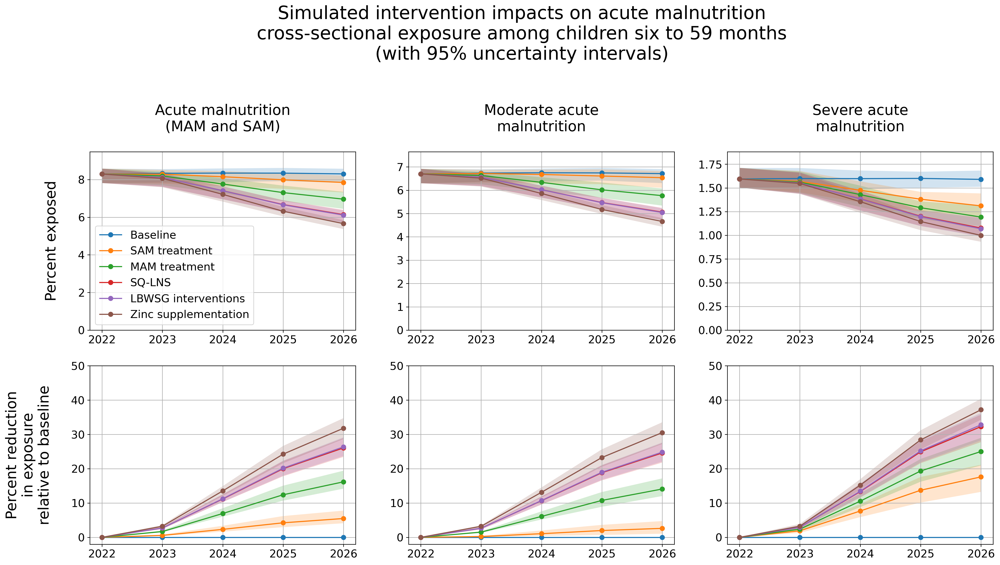

In [70]:
causes = ['wasted','moderate_acute_malnutrition','severe_acute_malnutrition']
cause_titles = ['Acute malnutrition\n(MAM and SAM)\n',
               'Moderate acute\nmalnutrition\n',
               'Severe acute\nmalnutrition\n']
metrics = ['value','percent_reduction']

fig, axs = plt.subplots(len(metrics), len(causes),dpi=250)
for metric in metrics:
    data = calculate_wasting_values(output_dir, six_to_59_ages, ['year'], 
                                        'prevalence', 
                                        metric, 
                                        'baseline')
    for cause in causes:
        p = data.loc[data.cause==cause]
        pos = axs[metrics.index(metric),causes.index(cause)]   
        for i in list(range(0,len(scenarios))):
            p_sub = p.loc[p.scenario==scenarios[i]]
            pos.plot(p_sub['year'], p_sub['value','mean'], marker='o', label=scenario_names[i])
            pos.fill_between(p_sub['year'], p_sub['value','2.5%'], p_sub['value','97.5%'], alpha=0.2)
        pos.grid()
        pos.set_xticks(p_sub.year.unique())
        pos.set_xticklabels(p_sub.year.unique(),fontsize=15)
        pos.tick_params(axis='y', labelsize=15)
        if metrics.index(metric)==0:
            pos.set_ylim(0,p.loc[p.scenario=='baseline']['value','97.5%'].max()*1.1)
            pos.set_title(cause_titles[causes.index(cause)],size=20)
            if causes.index(cause)==0:
                pos.set_ylabel('Percent exposed\n',size=20)
                pos.legend(#['Baseline','+Wasting Treatment','+SQ-LNS','+Zinc supplementation'], 
                       fontsize=15)
        if metric=='percent_reduction':
            pos.set_ylim(-2,50)
            if causes.index(cause)==0:
                pos.set_ylabel('Percent reduction\nin exposure\nrelative to baseline\n',size=20)

plt.subplots_adjust(right=len(causes), top=len(metrics))
#plt.legend(['Baseline','Alternative scenario 1','Alternative scenario 2'], bbox_to_anchor=[0.25,4.15], fontsize=20)
plt.suptitle('Simulated intervention impacts on acute malnutrition\ncross-sectional exposure among children six to 59 months\n(with 95% uncertainty intervals)',
             y=2.7,x=1.5,size=25)

<ipython-input-51-bd32712bcfec>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'
<ipython-input-51-bd32712bcfec>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'


Text(1.5, 2.7, 'Simulated intervention impacts on acute malnutrition\ncross-sectional exposure among children six to 11 months\n(with 95% uncertainty intervals)')

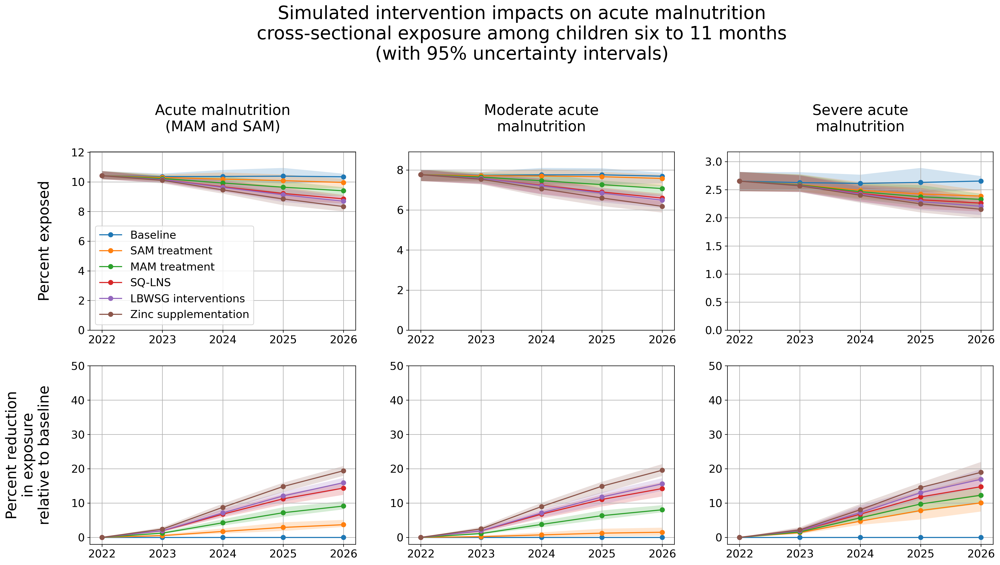

In [71]:
causes = ['wasted','moderate_acute_malnutrition','severe_acute_malnutrition']
cause_titles = ['Acute malnutrition\n(MAM and SAM)\n',
               'Moderate acute\nmalnutrition\n',
               'Severe acute\nmalnutrition\n']
metrics = ['value','percent_reduction']

fig, axs = plt.subplots(len(metrics), len(causes),dpi=250)
for metric in metrics:
    data = calculate_wasting_values(output_dir, ['6-11_months'], ['year'], 
                                        'prevalence', 
                                        metric, 
                                        'baseline')
    for cause in causes:
        p = data.loc[data.cause==cause]
        pos = axs[metrics.index(metric),causes.index(cause)]   
        for i in list(range(0,len(scenarios))):
            p_sub = p.loc[p.scenario==scenarios[i]]
            pos.plot(p_sub['year'], p_sub['value','mean'], marker='o', label=scenario_names[i])
            pos.fill_between(p_sub['year'], p_sub['value','2.5%'], p_sub['value','97.5%'], alpha=0.2)
        pos.grid()
        pos.set_xticks(p_sub.year.unique())
        pos.set_xticklabels(p_sub.year.unique(),fontsize=15)
        pos.tick_params(axis='y', labelsize=15)
        if metrics.index(metric)==0:
            pos.set_ylim(0,p.loc[p.scenario=='baseline']['value','97.5%'].max()*1.1)
            pos.set_title(cause_titles[causes.index(cause)],size=20)
            if causes.index(cause)==0:
                pos.set_ylabel('Percent exposed\n',size=20)
                pos.legend(#['Baseline','+Wasting Treatment','+SQ-LNS','+Zinc supplementation'], 
                       fontsize=15)
        if metric=='percent_reduction':
            pos.set_ylim(-2,50)
            if causes.index(cause)==0:
                pos.set_ylabel('Percent reduction\nin exposure\nrelative to baseline\n',size=20)

plt.subplots_adjust(right=len(causes), top=len(metrics))
#plt.legend(['Baseline','Alternative scenario 1','Alternative scenario 2'], bbox_to_anchor=[0.25,4.15], fontsize=20)
plt.suptitle('Simulated intervention impacts on acute malnutrition\ncross-sectional exposure among children six to 11 months\n(with 95% uncertainty intervals)',
             y=2.7,x=1.5,size=25)

# Finding 2: incidence

In [150]:
format_2026_table('incidence', 'value', 'baseline')

<ipython-input-51-bd32712bcfec>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'
<ipython-input-51-bd32712bcfec>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  total_mam['cause'] = 'total_mam'


scenario  \
                              
cause                         
0                  baseline   
3             sam_treatment   
2             mam_treatment   
4                     sqlns   
1       lbwsg_interventions   
5      zinc_supplementation   

                                                             result  \
                                                                      
cause mild_child_wasting_to_moderate_acute_malnutrition_event_count   
0                             23636.1 (20877.3, 25598.7)              
3                             23882.5 (21120.8, 25870.6)              
2                             24358.4 (21589.7, 26467.8)              
4                             20805.2 (18580.7, 22243.0)              
1                             20796.7 (18568.8, 22217.0)              
5                             18869.8 (17185.7, 20339.6)              

                                                                            
                                                                            
cause moderate_acute_malnutrition_to_severe_acute_malnutrition_event_count  
0                                5615.2 (4948.4, 6545.9)                    
3                                5449.7 (4797.3, 6346.0)                    
2                                4809.5 (4230.8, 5580.9)                    
4                                4210.9 (3701.8, 4929.1)                    
1                                4192.3 (3675.6, 4906.4)                    
5                                3829.2 (3434.8, 4424.5)

In [151]:
format_2026_table('incidence', 'absolute_reduction', 'baseline')

<ipython-input-51-bd32712bcfec>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'
<ipython-input-51-bd32712bcfec>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  total_mam['cause'] = 'total_mam'


scenario  \
                              
cause                         
0                  baseline   
3             sam_treatment   
2             mam_treatment   
4                     sqlns   
1       lbwsg_interventions   
5      zinc_supplementation   

                                                             result  \
                                                                      
cause mild_child_wasting_to_moderate_acute_malnutrition_event_count   
0                                         0.0 (0.0, 0.0)              
3                                -246.4 (-313.9, -188.9)              
2                                -722.3 (-869.1, -585.4)              
4                                2830.9 (1901.3, 3758.4)              
1                                2839.4 (1907.9, 3780.7)              
5                                4766.3 (3390.8, 5850.3)              

                                                                            
                                                                            
cause moderate_acute_malnutrition_to_severe_acute_malnutrition_event_count  
0                                         0.0 (0.0, 0.0)                    
3                                    165.5 (58.4, 312.3)                    
2                                  805.7 (607.1, 1066.2)                    
4                                1404.3 (1186.6, 1667.7)                    
1                                1422.8 (1206.1, 1687.8)                    
5                                1786.0 (1500.0, 2138.8)

In [152]:
format_2026_table('incidence', 'percent_reduction', 'baseline')

<ipython-input-51-bd32712bcfec>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'
<ipython-input-51-bd32712bcfec>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  total_mam['cause'] = 'total_mam'


scenario  \
                              
cause                         
0                  baseline   
3             sam_treatment   
2             mam_treatment   
4                     sqlns   
1       lbwsg_interventions   
5      zinc_supplementation   

                                                             result  \
                                                                      
cause mild_child_wasting_to_moderate_acute_malnutrition_event_count   
0                                         0.0 (0.0, 0.0)              
3                                      -1.0 (-1.4, -0.8)              
2                                      -3.1 (-3.6, -2.4)              
4                                       11.9 (8.4, 15.2)              
1                                       11.9 (8.4, 15.3)              
5                                      20.1 (15.8, 23.2)              

                                                                            
                                                                            
cause moderate_acute_malnutrition_to_severe_acute_malnutrition_event_count  
0                                         0.0 (0.0, 0.0)                    
3                                         2.9 (1.1, 5.2)                    
2                                      14.3 (11.7, 17.7)                    
4                                      25.0 (22.2, 28.1)                    
1                                      25.3 (22.4, 28.4)                    
5                                      31.7 (28.5, 34.9)

<ipython-input-51-bd32712bcfec>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'
<ipython-input-51-bd32712bcfec>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  total_mam['cause'] = 'total_mam'
<ipython-input-51-bd32712bcfec>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Text(1, 3.5, 'Simulated intervention impacts on acute malnutrition\nincidence rates among children six to 59 months\n(with 95% uncertainty intervals)')

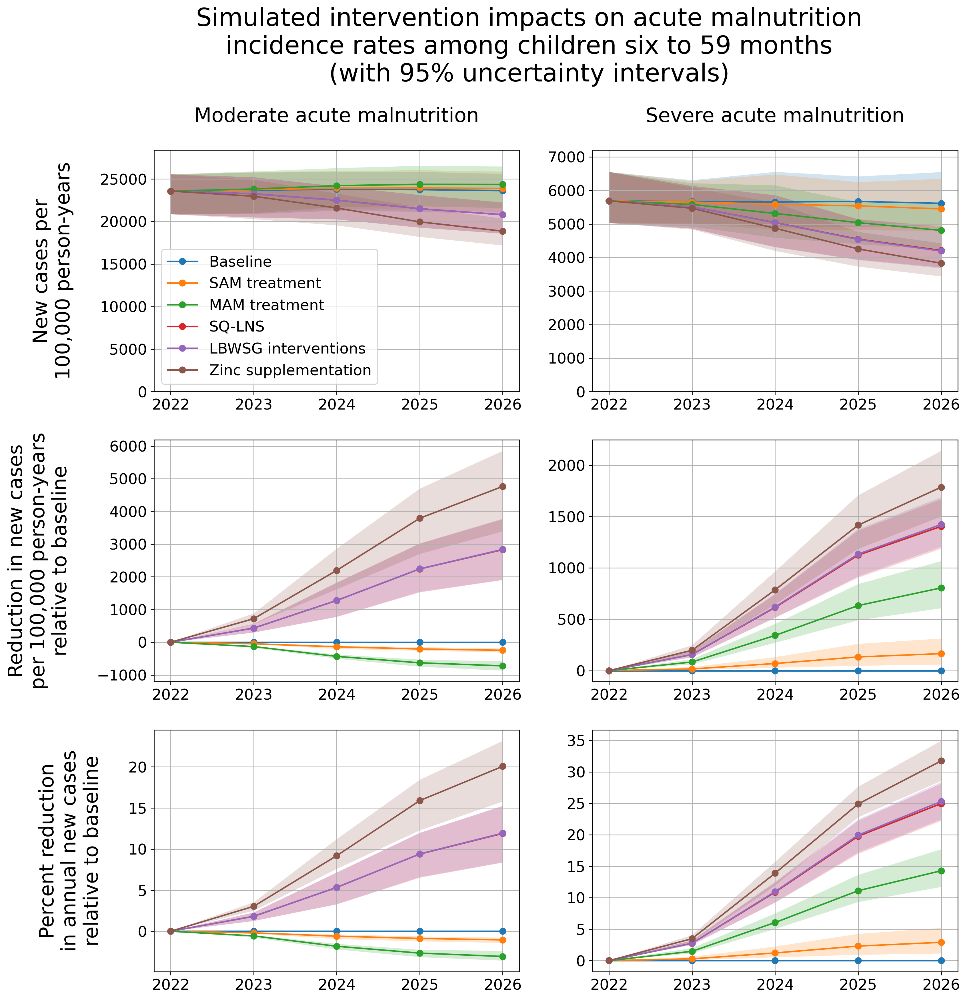

In [90]:
causes = ['mild_child_wasting_to_moderate_acute_malnutrition_event_count',
          'moderate_acute_malnutrition_to_severe_acute_malnutrition_event_count',
          #'total_mam',
          #'moderate_acute_malnutrition_to_severe_acute_malnutrition_event_count'
         ]

cause_titles = ['Moderate acute malnutrition\n',
                'Severe acute malnutrition\n',
                #'All transitions\ninto MAM\n',
                #'MAM cases from\nspontaneous\nSAM recovery'
               ]
metrics = ['value','absolute_reduction','percent_reduction']
metric_titles=['New cases per\n100,000 person-years\n',
              'Reduction in new cases\nper 100,000 person-years\nrelative to baseline\n',
              'Percent reduction\nin annual new cases\nrelative to baseline\n']

fig, axs = plt.subplots(len(metrics), len(causes),dpi=250)
for metric in metrics:
    data = calculate_wasting_values(output_dir, six_to_59_ages, ['year'], 
                                        'incidence', 
                                        metric, 
                                        'baseline')
    for cause in causes:
        p = data.loc[data.cause==cause]
        pos = axs[metrics.index(metric),causes.index(cause)]   
        for i in list(range(0,len(scenarios))):
            p_sub = p.loc[p.scenario==scenarios[i]]
            pos.plot(p_sub['year'], p_sub['value','mean'], marker='o', label=scenario_names[i])
            pos.fill_between(p_sub['year'], p_sub['value','2.5%'], p_sub['value','97.5%'], alpha=0.2)
        pos.grid()
        pos.set_xticks(p_sub.year.unique())
        pos.set_xticklabels(p_sub.year.unique(),fontsize=15)
        pos.tick_params(axis='y', labelsize=15)
        if causes.index(cause)==0:
            pos.set_ylabel(metric_titles[metrics.index(metric)],size=20)
            if metrics.index(metric)==0:
                pos.legend(#['Baseline','Alternative scenario 1','Alternative scenario 2'],
                      #bbox_to_anchor=[0.25,4.15], 
                       fontsize=15)
        if metrics.index(metric)==0:
            pos.set_title(cause_titles[causes.index(cause)],size=20)
            pos.set_ylim(0,p.loc[p.scenario=='baseline']['value','97.5%'].max()*1.1)
            
plt.subplots_adjust(right=len(causes), top=len(metrics))
#plt.legend(['Baseline','Alternative scenario 1','Alternative scenario 2'], bbox_to_anchor=[0.25,4.15], fontsize=20)
plt.suptitle('Simulated intervention impacts on acute malnutrition\nincidence rates among children six to 59 months\n(with 95% uncertainty intervals)',
             y=len(metrics)+.5,x=1,size=25)

# Finding 3: relative to alternative scenario 1

<ipython-input-51-bd32712bcfec>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'
<ipython-input-51-bd32712bcfec>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'
<ipython-input-51-bd32712bcfec>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#retu

Text(1.5, 5.7, 'Percent reduction in simulated acute malnutrition\ncross sectional exposure among children six to 59 months\n(with 95% uncertainty intervals)')

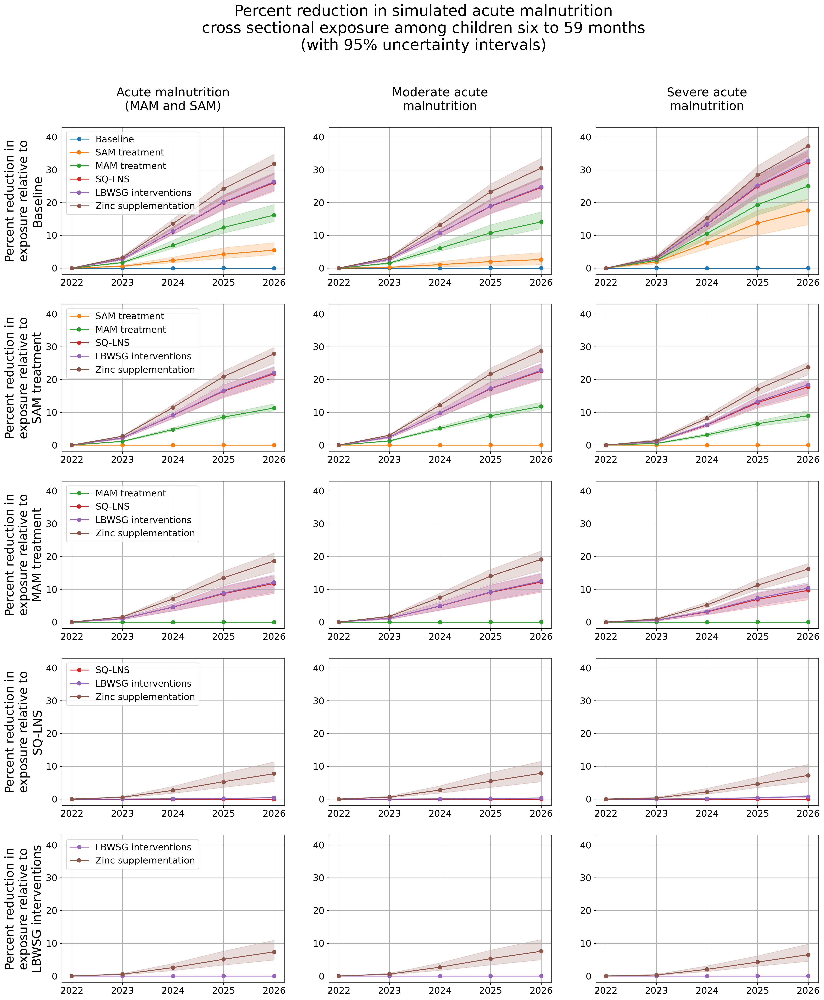

In [121]:
relative_scenarios = ['baseline','sam_treatment','mam_treatment','sqlns','lbwsg_interventions']

causes = ['wasted','moderate_acute_malnutrition','severe_acute_malnutrition']
cause_titles = ['Acute malnutrition\n(MAM and SAM)\n',
               'Moderate acute\nmalnutrition\n',
               'Severe acute\nmalnutrition\n']

fig, axs = plt.subplots(len(relative_scenarios), len(causes),dpi=250)
for relative_scenario in relative_scenarios:
    data = calculate_wasting_values(output_dir, six_to_59_ages, ['year'], 
                                        'prevalence', 
                                        'percent_reduction', 
                                        relative_scenario)
    for cause in causes:
        p = data.loc[data.cause==cause]
        pos = axs[relative_scenarios.index(relative_scenario),causes.index(cause)]  
        scens = scenarios[scenarios.index(relative_scenario):len(scenarios)]
        
        for scenario in scens:
            p_sub = p.loc[p.scenario==scenario]
            pos.plot(p_sub['year'], p_sub['value','mean'], marker='o', 
                     label=scenario_names[scenarios.index(scenario)],
                    color=scenario_colors[scenarios.index(scenario)])
            pos.fill_between(p_sub['year'], p_sub['value','2.5%'], p_sub['value','97.5%'], 
                             alpha=0.2, color=scenario_colors[scenarios.index(scenario)])
        pos.grid()
        pos.set_xticks(p_sub.year.unique())
        pos.set_xticklabels(p_sub.year.unique(),fontsize=15)
        pos.tick_params(axis='y', labelsize=15)
        pos.set_ylim(-2,43)
        if relative_scenarios.index(relative_scenario)==0:
            pos.set_title(cause_titles[causes.index(cause)],size=20)
        if causes.index(cause)==0:
            pos.set_ylabel(f'Percent reduction in\nexposure relative to\n{scenario_names[relative_scenarios.index(relative_scenario)]}'
                               ,size=20)
            pos.legend(fontsize=15, loc='upper left')

plt.subplots_adjust(right=len(causes), top=len(relative_scenarios))
plt.suptitle('Percent reduction in simulated acute malnutrition\ncross sectional exposure among children six to 59 months\n(with 95% uncertainty intervals)',
             y=len(relative_scenarios) + 0.7,x=1.5,size=25)

<ipython-input-51-bd32712bcfec>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'
<ipython-input-51-bd32712bcfec>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  total_mam['cause'] = 'total_mam'
<ipython-input-51-bd32712bcfec>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Text(1, 5.5, 'Percent reduction in simulated acute malnutrition\nincidence rates among children six to 59 months\n(with 95% uncertainty intervals)')

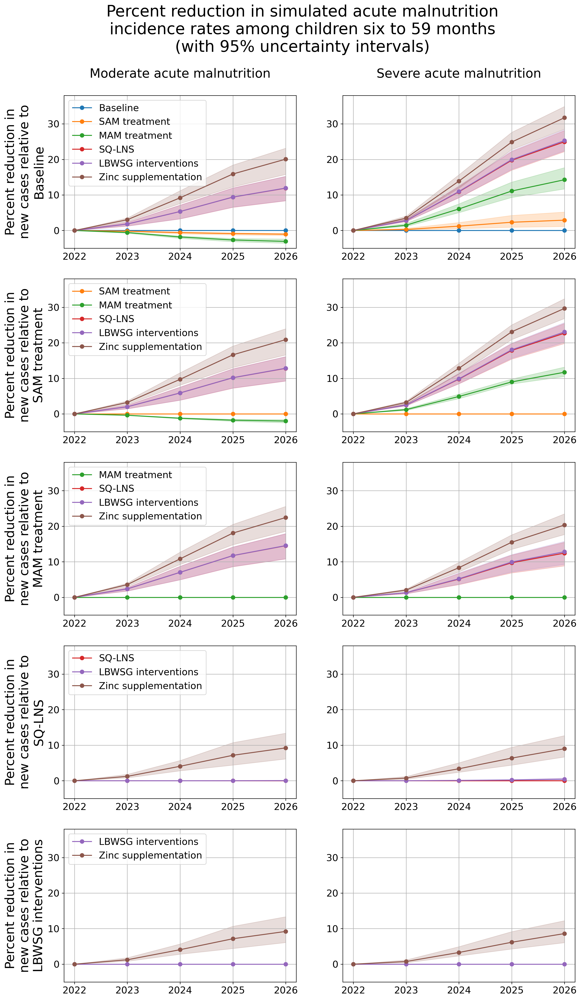

In [125]:
relative_scenarios = ['baseline','sam_treatment','mam_treatment','sqlns','lbwsg_interventions']
causes = ['mild_child_wasting_to_moderate_acute_malnutrition_event_count',
          'moderate_acute_malnutrition_to_severe_acute_malnutrition_event_count',
         ]

cause_titles = ['Moderate acute malnutrition\n',
                'Severe acute malnutrition\n',
               ]

fig, axs = plt.subplots(len(relative_scenarios), len(causes),dpi=250)
for relative_scenario in relative_scenarios:
    data = calculate_wasting_values(output_dir, six_to_59_ages, ['year'], 
                                        'incidence', 
                                        'percent_reduction', 
                                        relative_scenario)
    for cause in causes:
        p = data.loc[data.cause==cause]
        pos = axs[relative_scenarios.index(relative_scenario),causes.index(cause)]  
        scens = scenarios[scenarios.index(relative_scenario):len(scenarios)]
        
        for scenario in scens:
            p_sub = p.loc[p.scenario==scenario]
            pos.plot(p_sub['year'], p_sub['value','mean'], marker='o', 
                     label=scenario_names[scenarios.index(scenario)],
                    color=scenario_colors[scenarios.index(scenario)])
            pos.fill_between(p_sub['year'], p_sub['value','2.5%'], p_sub['value','97.5%'], 
                             alpha=0.2, color=scenario_colors[scenarios.index(scenario)])
        pos.grid()
        pos.set_xticks(p_sub.year.unique())
        pos.set_xticklabels(p_sub.year.unique(),fontsize=15)
        pos.tick_params(axis='y', labelsize=15)
        pos.set_ylim(-5,38)
        if relative_scenarios.index(relative_scenario)==0:
            pos.set_title(cause_titles[causes.index(cause)],size=20)
        if causes.index(cause)==0:
            pos.set_ylabel(f'Percent reduction in\nnew cases relative to\n{scenario_names[relative_scenarios.index(relative_scenario)]}'
                               ,size=20)
            pos.legend(fontsize=15, loc='upper left')

plt.subplots_adjust(right=len(causes), top=len(relative_scenarios))
plt.suptitle('Percent reduction in simulated acute malnutrition\nincidence rates among children six to 59 months\n(with 95% uncertainty intervals)',
             y=len(relative_scenarios) + 0.5,x=1,size=25)

# Finding 4: stunting exposures

In [126]:
# stunting reduction
def calculate_stunting_values(output_dir, ages, strata_cols, metric, 
                             relative_scenario):
    data = pd.read_csv(output_dir + 'stunting_state_person_time.csv').drop(columns=['Unnamed: 0'])
    stunted = data.loc[data.cause.isin(['cat1','cat2'])]
    groupby_cols = ['input_draw','scenario','cause']
    stunted = (stunted.groupby([c for c in stunted.columns if c != 'cause' and c != 'value']).sum())
    stunted['cause'] = 'stunted'
    data = pd.concat([data,stunted.reset_index()],ignore_index=True)
    data = data.loc[data.age.isin(ages)]
    data = data.groupby(['input_draw','scenario'] + strata_cols + ['cause']).sum()
    data = data / data.groupby(['input_draw','scenario'] + strata_cols).sum() * 100
    if metric=='value':
        data = (data.groupby(['scenario','cause'] + strata_cols)
                    .describe(percentiles=[0.025,0.975]))
    else:
        data_baseline = (data.reset_index().loc[data.reset_index().scenario==relative_scenario]
                   .set_index(['input_draw','cause'] + strata_cols)
                   .drop(columns='scenario'))
        if metric=='percent_reduction':
            data = ((data_baseline - data.reset_index().set_index(['input_draw','cause'] + strata_cols + ['scenario']))
                    / data_baseline) * 100
        elif metric=='absolute_reduction':
            data = data_baseline - data.reset_index().set_index(['input_draw','cause'] + strata_cols + ['scenario'])
            
        data = (data.reset_index().groupby(['scenario','cause'] + strata_cols)
                .describe(percentiles=[0.025,0.975])).drop(columns='input_draw')
        
    return data[['value']].reset_index()

In [127]:
def plot_values_by_year(data,
                          title, 
                          ylabel,
                          legend=True):
    plt.figure(dpi=120)
    p = data.copy()
    for i in ['baseline','sam_treatment','mam_treatment','sqlns','lbwsg_interventions','zinc_supplementation']:
        p_sub = p.loc[p.scenario==i]
        plt.plot(p_sub['year'], p_sub['value','mean'], marker='o', label=i)
        plt.fill_between(p_sub['year'], p_sub['value','2.5%'], p_sub['value','97.5%'], alpha=0.2)
    if legend==True:
        plt.legend(#['Baseline',
                #'Wasting treatment scale-up',
                #'SQ-LNS and wasting treatment scale-up'],
              fontsize=13)
    plt.xticks(p.year.unique(),size=14)
    plt.yticks(size=14)
    plt.ylabel(ylabel,size=14)
    plt.ylim(0,p['value','97.5%'].max()*1.12)
    plt.grid()
    plt.title(title, size=18)

In [128]:
b = calculate_stunting_values(output_dir, six_to_59_ages, ['year'], 'value', 
                             'baseline')
b = b.loc[b.year==2026]
b['result'] = (b['value','mean'].round(1).astype(str)
              + ' ('
              + b['value','2.5%'].round(1).astype(str)
              + ', '
              + b['value','97.5%'].round(1).astype(str)
              + ')')
b.loc[b.cause=='cat1'].drop(columns='value')#.pivot_table(index='cause',columns='scenario',values='result')

/ihme/code/alibow/miniconda/envs/vivarium_ciff_sam/lib/python3.8/site-packages/pandas/core/generic.py:4150: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


,scenario,cause,year,result
,,,,
4,baseline,cat1,2026,"12.8 (12.0, 13.3)"
29,lbwsg_interventions,cat1,2026,"11.2 (10.0, 12.2)"
54,mam_treatment,cat1,2026,"12.8 (12.0, 13.3)"
79,sam_treatment,cat1,2026,"12.8 (12.0, 13.3)"
104,sqlns,cat1,2026,"11.2 (10.0, 12.2)"
129,zinc_supplementation,cat1,2026,"11.2 (10.0, 12.2)"


In [129]:
b = calculate_stunting_values(output_dir, six_to_59_ages, ['year'], 'percent_reduction', 
                             'baseline')
b = b.loc[b.year==2026]
b['result'] = (b['value','mean'].round(1).astype(str)
              + ' ('
              + b['value','2.5%'].round(1).astype(str)
              + ', '
              + b['value','97.5%'].round(1).astype(str)
              + ')')
b.loc[b.cause=='stunted'].drop(columns='value')#.pivot_table(index='cause',columns='scenario',values='result')

/ihme/code/alibow/miniconda/envs/vivarium_ciff_sam/lib/python3.8/site-packages/pandas/core/generic.py:4150: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


,scenario,cause,year,result
,,,,
24,baseline,stunted,2026,"0.0 (0.0, 0.0)"
49,lbwsg_interventions,stunted,2026,"8.4 (5.6, 12.1)"
74,mam_treatment,stunted,2026,"-0.0 (-0.0, -0.0)"
99,sam_treatment,stunted,2026,"-0.0 (-0.0, 0.0)"
124,sqlns,stunted,2026,"7.9 (5.2, 11.4)"
149,zinc_supplementation,stunted,2026,"8.4 (5.6, 12.0)"


Text(1.5, 2.6, 'Simulated intervention impacts on child stunting\nexposure among children six to 59 months\n(with 95% uncertainty intervals)')

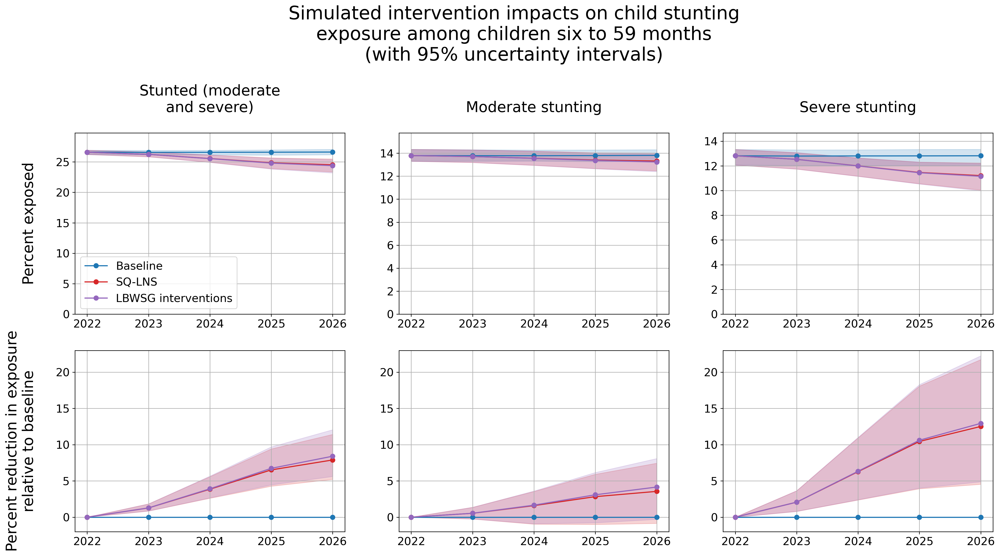

In [134]:
causes = ['stunted',
          'cat2',
          'cat1',]

cause_titles = ['Stunted (moderate\nand severe)\n',
                'Moderate stunting\n',
                'Severe stunting\n'
               ]

metrics = ['value','percent_reduction']

scens = ['baseline','sqlns','lbwsg_interventions']

fig, axs = plt.subplots(len(metrics), len(causes),dpi=250)
for metric in metrics:
    data = calculate_stunting_values(output_dir, six_to_59_ages, ['year'], 
                                        metric, 
                                        'baseline')
    for cause in causes:
        p = data.loc[data.cause==cause]
        pos = axs[metrics.index(metric),causes.index(cause)]   
        for i in list(range(0,len(scens))):
            p_sub = p.loc[p.scenario==scens[i]]
            pos.plot(p_sub['year'], p_sub['value','mean'], marker='o', label=scenario_names[scenarios.index(scens[i])],
                    c = scenario_colors[scenarios.index(scens[i])])
            pos.fill_between(p_sub['year'], p_sub['value','2.5%'], p_sub['value','97.5%'], alpha=0.2,
                            color = scenario_colors[scenarios.index(scens[i])])
        pos.grid()
        pos.set_xticks(p_sub.year.unique())
        pos.set_xticklabels(p_sub.year.unique(),fontsize=15)
        pos.tick_params(axis='y', labelsize=15)
        if metrics.index(metric)==0:
            pos.set_ylim(0,p.loc[p.scenario=='baseline']['value','97.5%'].max()*1.1)
            pos.set_title(cause_titles[causes.index(cause)],size=20)
            if causes.index(cause)==0:
                pos.set_ylabel('Percent exposed\n',size=20)
                pos.legend(#['Baseline','Alternative scenario 1','Alternative scenario 2'],
                       fontsize=15)
        else:
            pos.set_ylim(-2,23)
            if causes.index(cause)==0:
                pos.set_ylabel('Percent reduction in exposure\nrelative to baseline\n',size=20)


plt.subplots_adjust(right=len(causes), top=len(metrics))
plt.suptitle('Simulated intervention impacts on child stunting\nexposure among children six to 59 months\n(with 95% uncertainty intervals)',
             y=2.6,x=1.5,size=25)

# Finding 5: mortality and morbidity outcomes

In [153]:
def calculate_mortality_values(output_dir, ages, strata_cols, metric, 
                             relative_scenario, measure):
    if measure == 'dalys':
        ylls = pd.read_csv(output_dir + 'ylls.csv').drop(columns=['Unnamed: 0','measure'])
        ylds = pd.read_csv(output_dir + 'ylds.csv').drop(columns=['Unnamed: 0','measure'])
        data = pd.concat([ylls,ylds]).groupby([c for c in ylls.columns if c != 'value' and c != 'cause']).sum().reset_index()
    else:
        data = pd.read_csv(output_dir + f'{measure}.csv').drop(columns=['Unnamed: 0'])
    pt = pd.read_csv(output_dir + 'wasting_state_person_time.csv').drop(columns='Unnamed: 0')
    groupby_cols = ['input_draw','scenario']
    data = data.loc[data.age.isin(ages)]
    pt = pt.loc[pt.age.isin(ages)]
    data = (data.groupby(['input_draw','scenario'] + strata_cols).sum()
            / pt.groupby(['input_draw','scenario'] + strata_cols).sum()
            * 100_000)
    if metric=='val':
        data = (data.groupby(['scenario'] + strata_cols)
                    .describe(percentiles=[0.025,0.975]))
    else:
        data_baseline = (data.reset_index().loc[data.reset_index().scenario==relative_scenario]
                   .set_index(['input_draw'] + strata_cols)
                   .drop(columns='scenario'))
        if metric=='percent_reduction':
            data = ((data_baseline - data.reset_index().set_index(['input_draw'] + strata_cols + ['scenario']))
                    / data_baseline) * 100
        elif metric=='absolute_reduction':
            data = data_baseline - data.reset_index().set_index(['input_draw'] + strata_cols + ['scenario'])
            
        data = (data.reset_index().groupby(['scenario'] + strata_cols)
                .describe(percentiles=[0.025,0.975])).drop(columns='input_draw')
        
    return data[['value']].reset_index()

In [160]:
b = calculate_mortality_values(output_dir, ages, ['year'], 'absolute_reduction', 
                             'baseline', 'dalys')
b = b.loc[b.year==2026]
b['result'] = (b['value','mean'].round(0).astype(int).astype(str)
              + ' ('
              + b['value','2.5%'].round(0).astype(int).astype(str)
              + ', '
              + b['value','97.5%'].round(0).astype(int).astype(str)
              + ')')
b['scenario_order'] = np.where(b.scenario=='baseline',0,
                                  np.where(b.scenario=='sam_treatment',1,
                                          np.where(b.scenario=='mam_treatment',2,
                                                  np.where(b.scenario=='sqlns',3,
                                                          np.where(b.scenario=='lbwsg_interventions',4,5)))))
b=b.sort_values(by='scenario_order')
b.drop(columns='value')

/ihme/code/alibow/miniconda/envs/vivarium_ciff_sam/lib/python3.8/site-packages/pandas/core/generic.py:4150: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


,scenario,year,result,scenario_order
,,,,
4,baseline,2026,"0 (0, 0)",0
19,sam_treatment,2026,"498 (219, 1017)",1
14,mam_treatment,2026,"1125 (652, 1670)",2
24,sqlns,2026,"2503 (1201, 3958)",3
9,lbwsg_interventions,2026,"2595 (1315, 4156)",4
29,zinc_supplementation,2026,"4683 (2945, 6453)",5


In [161]:
b = calculate_mortality_values(output_dir, ages, ['year'], 'val', 
                             'baseline', 'ylls')
b = b.loc[b.year==2026]
b['result'] = (b['value','mean'].round(0).astype(int).astype(str)
              + ' ('
              + b['value','2.5%'].round(0).astype(int).astype(str)
              + ' to '
              + b['value','97.5%'].round(0).astype(int).astype(str)
              + ')')
b['scenario_order'] = np.where(b.scenario=='baseline',0,
                                  np.where(b.scenario=='sam_treatment',1,
                                          np.where(b.scenario=='mam_treatment',2,
                                                  np.where(b.scenario=='sqlns',3,
                                                          np.where(b.scenario=='lbwsg_interventions',4,5)))))
b=b.sort_values(by='scenario_order')
b.drop(columns='value')

/ihme/code/alibow/miniconda/envs/vivarium_ciff_sam/lib/python3.8/site-packages/pandas/core/generic.py:4150: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


,scenario,year,result,scenario_order
,,,,
4,baseline,2026,"44501 (30890, 52660)",0
19,sam_treatment,2026,"44043 (30636, 52117)",1
14,mam_treatment,2026,"43436 (29973, 51177)",2
24,sqlns,2026,"42082 (29469, 49576)",3
9,lbwsg_interventions,2026,"41992 (29433, 49504)",4
29,zinc_supplementation,2026,"39954 (28117, 46850)",5


Text(2, 3.6, 'Simulated morbidity and mortality outcomes\namong children aged six to 59 months\n(with 95% uncertainty intervals)')

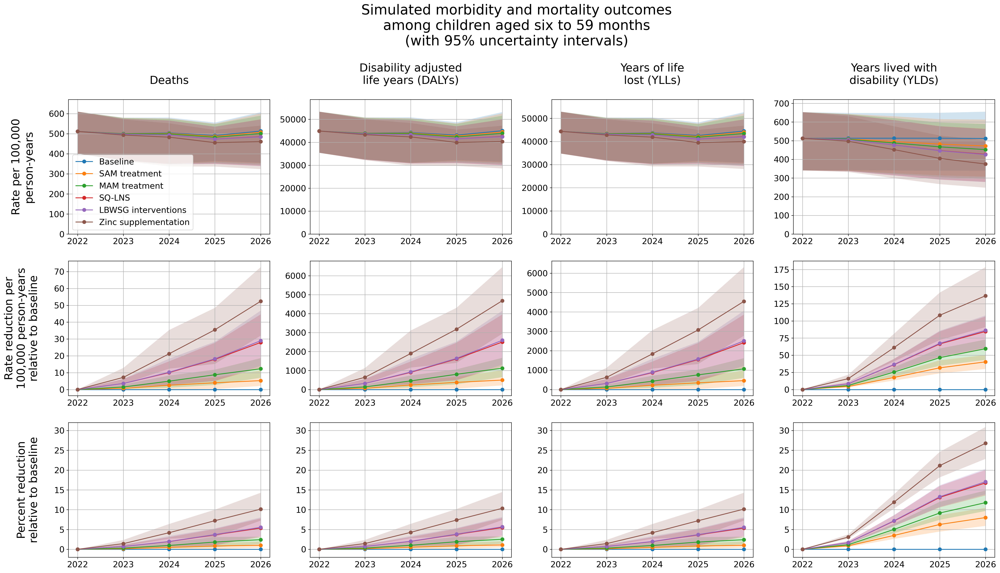

In [165]:
measures = ['deaths',
          'dalys',
          'ylls',
         'ylds']
measure_titles = ['Deaths\n',
                 'Disability adjusted\nlife years (DALYs)\n',
                 'Years of life\nlost (YLLs)\n',
                 'Years lived with\ndisability (YLDs)\n']

metrics = ['val','absolute_reduction','percent_reduction']
metric_titles = ['Rate per 100,000\nperson-years\n',
                 'Rate reduction per\n100,000 person-years\nrelative to baseline\n',
                 'Percent reduction\nrelative to baseline\n'
                ]

fig, axs = plt.subplots(len(metrics), 
                        len(measures),
                        dpi=250)
for metric in metrics:
    for measure in measures:
        data = calculate_mortality_values(output_dir, ages, ['year'], metric, 
                             'baseline', measure)
        pos = axs[metrics.index(metric),measures.index(measure)]   
        for i in list(range(0,len(scenarios))):
            p_sub = data.loc[data.scenario==scenarios[i]]
            pos.plot(p_sub['year'], p_sub['value','mean'], marker='o', label=scenario_names[i])
            pos.fill_between(p_sub['year'], p_sub['value','2.5%'], p_sub['value','97.5%'], alpha=0.2)
        pos.grid()
        pos.set_xticks(p_sub.year.unique())
        pos.set_xticklabels(p_sub.year.unique(),fontsize=15)
        pos.tick_params(axis='y', labelsize=15)
        if metrics.index(metric)==0:
            pos.set_title(measure_titles[measures.index(measure)],size=20)
            pos.set_ylim(0,data.loc[data.scenario=='baseline']['value','97.5%'].max()*1.1)
            if measures.index(measure)==0:
                pos.legend(fontsize=15)
        if measures.index(measure)==0:
            pos.set_ylabel(metric_titles[metrics.index(metric)],size=20)
        if metric=='percent_reduction':
            pos.set_ylim(-2,32)
       

plt.subplots_adjust(right=len(measures), top=len(metrics))
plt.suptitle('Simulated morbidity and mortality outcomes\namong children aged six to 59 months\n(with 95% uncertainty intervals)',
             y=3.6,x=2,size=25)

# intervention coverage

Text(1, 1.25, 'SAM Treatment Intervention Parameters\n(with 95% confidence intervals)')

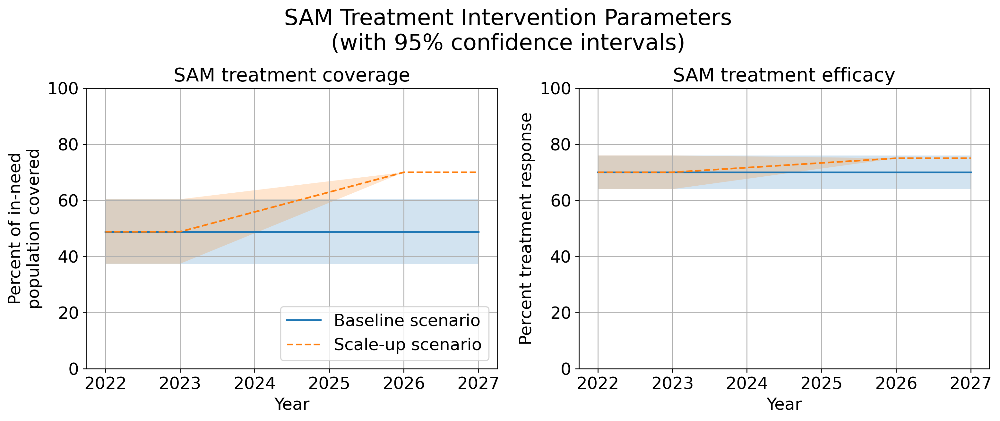

In [9]:
baseline_vals = [48.8, 70]
baseline_lcls = [37.4, 64]
baseline_ucls = [60.4, 76]
targets = [70, 75]
titles = [
         'SAM treatment coverage',
         'SAM treatment efficacy']
num1s = [0,0]
num2s = [0,1]
labels=['Baseline','Alternative']

years = list(range(2022,2028))
fig, axs = plt.subplots(1,2,
                        dpi=250)

for i in list(range(0,len(baseline_vals))):

    axs[num2s[i]].plot(years,[baseline_vals[i]]*len(years), label='Baseline scenario')
    axs[num2s[i]].fill_between(years, [baseline_lcls[i]]*len(years), [baseline_ucls[i]]*len(years),alpha=0.2)
    axs[num2s[i]].plot([2022,2023,2026,2027],[baseline_vals[i],
                                                       baseline_vals[i],
                                                       targets[i],
                                                       targets[i]], linestyle='dashed', label='Scale-up scenario')
    axs[num2s[i]].fill_between([2022,2023,2026,2027],[baseline_lcls[i],
                                                       baseline_lcls[i],
                                                       targets[i],
                                                       targets[i]],
                                        [baseline_ucls[i],
                                                       baseline_ucls[i],
                                                       targets[i],
                                                       targets[i]],alpha=0.2)
    axs[num2s[i]].grid()
    axs[num2s[i]].set_ylim(0,100)
    axs[num2s[i]].set_title(titles[i],size=17)
    axs[0].set_ylabel('Percent of in-need\npopulation covered',size=15)
    axs[1].set_ylabel('Percent treatment response',size=15)
    axs[num2s[i]].tick_params(axis='y', labelsize=15)
    axs[num2s[i]].tick_params(axis='x', labelsize=15)
    axs[num2s[i]].set_xlabel('Year',size=15)

    axs[0].legend(fontsize=15,loc='lower right')#bbox_to_anchor=[1.5,2.2],)
plt.subplots_adjust(right=2, top=1)
plt.suptitle('SAM Treatment Intervention Parameters\n(with 95% confidence intervals)',
            fontsize=20,y=1.25,x=1)

In [2]:
import matplotlib.pyplot as plt

Text(1, 1.25, 'MAM Treatment Intervention Parameters\n(with 95% confidence intervals)')

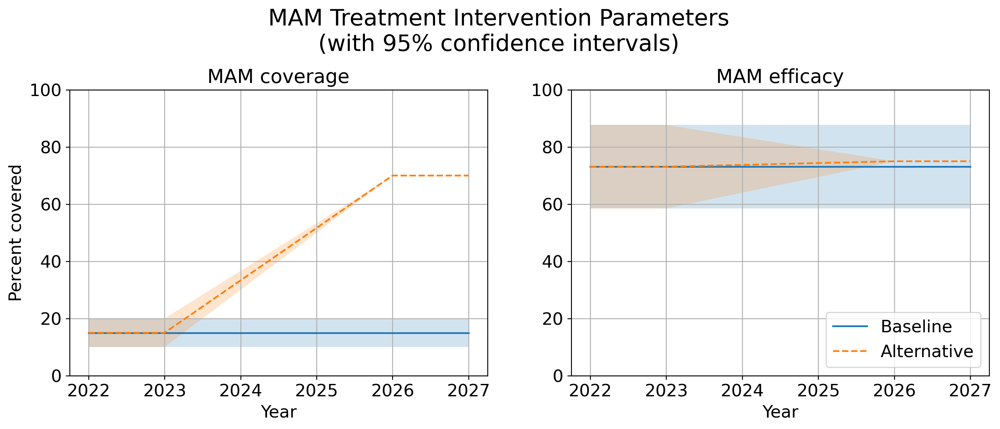

In [220]:
baseline_vals = [15, 73.1]
baseline_lcls = [10, 58.5]
baseline_ucls = [20, 87.7]
targets = [70, 75]
titles = [
         'MAM coverage',
         'MAM efficacy']
num1s = [0,0]
num2s = [0,1]
labels=['Baseline','Alternative']

years = list(range(2022,2028))
fig, axs = plt.subplots(1,2,
                        dpi=250)

for i in list(range(0,len(baseline_vals))):

    axs[num2s[i]].plot(years,[baseline_vals[i]]*len(years), label='Baseline')
    axs[num2s[i]].fill_between(years, [baseline_lcls[i]]*len(years), [baseline_ucls[i]]*len(years),alpha=0.2)
    axs[num2s[i]].plot([2022,2023,2026,2027],[baseline_vals[i],
                                                       baseline_vals[i],
                                                       targets[i],
                                                       targets[i]], linestyle='dashed', label='Alternative')
    axs[num2s[i]].fill_between([2022,2023,2026,2027],[baseline_lcls[i],
                                                       baseline_lcls[i],
                                                       targets[i],
                                                       targets[i]],
                                        [baseline_ucls[i],
                                                       baseline_ucls[i],
                                                       targets[i],
                                                       targets[i]],alpha=0.2)
    axs[num2s[i]].grid()
    axs[num2s[i]].set_ylim(0,100)
    axs[num2s[i]].set_title(titles[i],size=17)
    axs[0].set_ylabel('Percent covered',size=15)
    axs[num2s[i]].tick_params(axis='y', labelsize=15)
    axs[num2s[i]].tick_params(axis='x', labelsize=15)
    axs[num2s[i]].set_xlabel('Year',size=15)

plt.legend(fontsize=15,loc='lower right')#bbox_to_anchor=[1.5,2.2],)
plt.subplots_adjust(right=2, top=1)
plt.suptitle('MAM Treatment Intervention Parameters\n(with 95% confidence intervals)',
            fontsize=20,y=1.25,x=1)

(array([-20.,   0.,  20.,  40.,  60.,  80., 100., 120.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

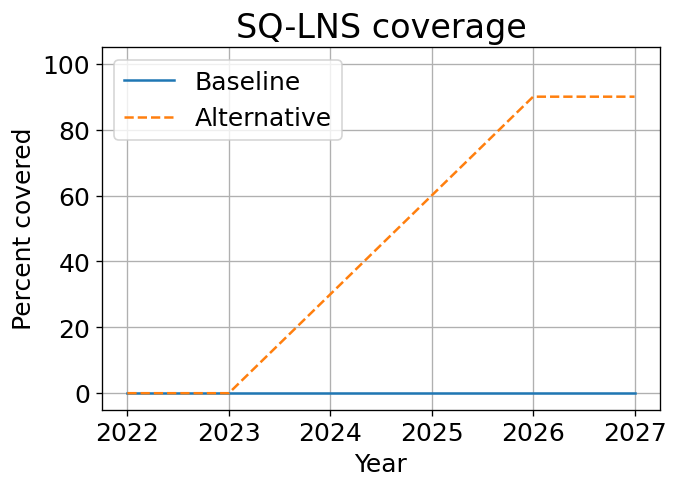

In [229]:
baseline_vals=[0]
baseline_ucls=[0]
baseline_lcls=[0]
targets=[90]
plt.figure(dpi=120)
for i in [0]:
    plt.plot(years,[baseline_vals[i]]*len(years),label='Baseline')
    plt.fill_between(years, [baseline_lcls[i]]*len(years), [baseline_ucls[i]]*len(years),alpha=0.2)
    plt.plot([2022,2023,2026,2027],[baseline_vals[i],
                                                       baseline_vals[i],
                                                       targets[i],
                                                       targets[i]], linestyle='dashed', label='Alternative')
    plt.fill_between([2022,2023,2026,2027],[baseline_lcls[i],
                                                       baseline_lcls[i],
                                                       targets[i],
                                                       targets[i]],
                                        [baseline_ucls[i],
                                                       baseline_ucls[i],
                                                       targets[i],
                                                       targets[i]],alpha=0.2)
plt.grid()
plt.ylim(-5,105)
plt.title('SQ-LNS coverage',size=20)
plt.legend(fontsize=15)
plt.ylabel('Percent covered',size=15)
plt.xlabel('Year',size=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

Text(1, 1.25, 'Zinc Supplementation Intervention Parameters\n(with 95% confidence intervals)')

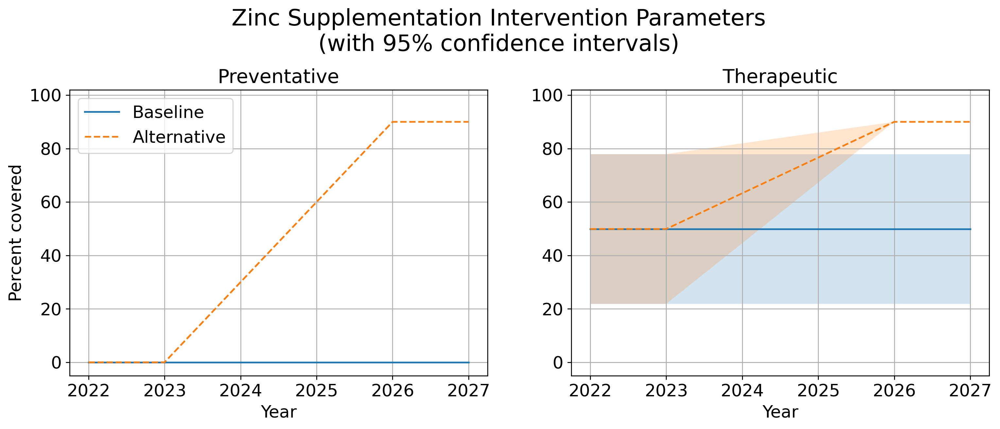

In [236]:
baseline_vals = [0, 49.9]
baseline_lcls = [0, 49.9-1.96*14.3]
baseline_ucls = [0, 49.9+1.96*14.3]
targets = [90, 90]
titles = [
         'Preventative',
         'Therapeutic']
num1s = [0,0]
num2s = [0,1]
labels=['Baseline','Alternative']

years = list(range(2022,2028))
fig, axs = plt.subplots(1,2,
                        dpi=250)

for i in list(range(0,len(baseline_vals))):

    axs[num2s[i]].plot(years,[baseline_vals[i]]*len(years), label='Baseline')
    axs[num2s[i]].fill_between(years, [baseline_lcls[i]]*len(years), [baseline_ucls[i]]*len(years),alpha=0.2)
    axs[num2s[i]].plot([2022,2023,2026,2027],[baseline_vals[i],
                                                       baseline_vals[i],
                                                       targets[i],
                                                       targets[i]], linestyle='dashed', label='Alternative')
    axs[num2s[i]].fill_between([2022,2023,2026,2027],[baseline_lcls[i],
                                                       baseline_lcls[i],
                                                       targets[i],
                                                       targets[i]],
                                        [baseline_ucls[i],
                                                       baseline_ucls[i],
                                                       targets[i],
                                                       targets[i]],alpha=0.2)
    axs[num2s[i]].grid()
    axs[num2s[i]].set_ylim(-5,102)
    axs[num2s[i]].set_title(titles[i],size=17)
    axs[0].set_ylabel('Percent covered',size=15)
    axs[num2s[i]].tick_params(axis='y', labelsize=15)
    axs[num2s[i]].tick_params(axis='x', labelsize=15)
    axs[num2s[i]].set_xlabel('Year',size=15)
axs[0].legend(fontsize=15,loc='upper left')


plt.subplots_adjust(right=2, top=1)
plt.suptitle('Zinc Supplementation Intervention Parameters\n(with 95% confidence intervals)',
            fontsize=20,y=1.25,x=1)

Text(1.5, 1.35, 'ITNs During Pregnancy Intervention Parameters\n(with 95% confidence intervals)')

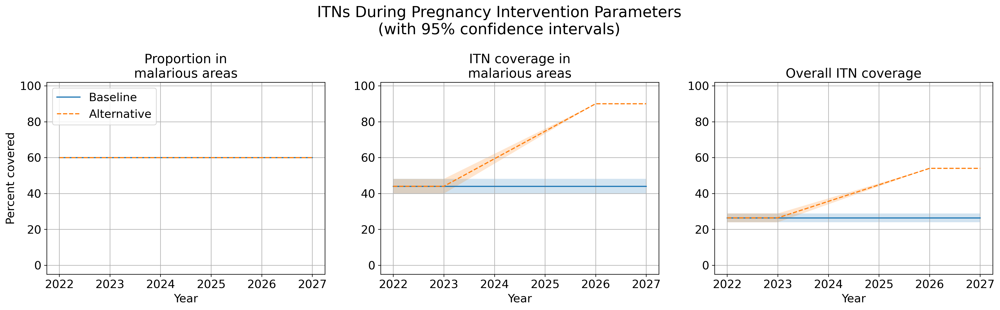

In [246]:
baseline_vals = [60, 44, 44*0.60]
baseline_lcls = [60, 44-1.96*2.1, (44-1.96*2.1)*0.6]
baseline_ucls = [60, 44+1.96*2.1, (44+1.96*2.1)*0.6]
targets = [60, 90, 90*0.6]
titles = [
         'Proportion in\nmalarious areas',
         'ITN coverage in\nmalarious areas',
    'Overall ITN coverage']
num1s = [0,0,1]
num2s = [0,1,2]
labels=['Baseline','Alternative']

years = list(range(2022,2028))
fig, axs = plt.subplots(1,3,
                        dpi=250)

for i in list(range(0,len(baseline_vals))):

    axs[num2s[i]].plot(years,[baseline_vals[i]]*len(years), label='Baseline')
    axs[num2s[i]].fill_between(years, [baseline_lcls[i]]*len(years), [baseline_ucls[i]]*len(years),alpha=0.2)
    axs[num2s[i]].plot([2022,2023,2026,2027],[baseline_vals[i],
                                                       baseline_vals[i],
                                                       targets[i],
                                                       targets[i]], linestyle='dashed', label='Alternative')
    axs[num2s[i]].fill_between([2022,2023,2026,2027],[baseline_lcls[i],
                                                       baseline_lcls[i],
                                                       targets[i],
                                                       targets[i]],
                                        [baseline_ucls[i],
                                                       baseline_ucls[i],
                                                       targets[i],
                                                       targets[i]],alpha=0.2)
    axs[num2s[i]].grid()
    axs[num2s[i]].set_ylim(-5,102)
    axs[num2s[i]].set_title(titles[i],size=17)
    axs[0].set_ylabel('Percent covered',size=15)
    axs[num2s[i]].tick_params(axis='y', labelsize=15)
    axs[num2s[i]].tick_params(axis='x', labelsize=15)
    axs[num2s[i]].set_xlabel('Year',size=15)
axs[0].legend(fontsize=15,loc='upper left')


plt.subplots_adjust(right=3, top=1)
plt.suptitle('ITNs During Pregnancy Intervention Parameters\n(with 95% confidence intervals)',
            fontsize=20,y=1.35,x=1.5)

Text(1.5, 1.25, 'Supplementation During Pregnancy Intervention Parameters\n(with 95% confidence intervals)')

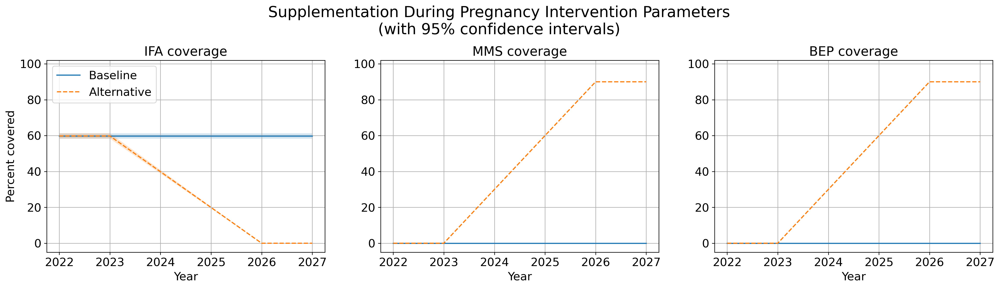

In [245]:
baseline_vals = [59.8, 0, 0]
baseline_lcls = [58.3, 0, 0]
baseline_ucls = [61.3, 0, 0]
targets = [0, 90, 90]
titles = [
         'IFA coverage',
         'MMS coverage',
    'BEP coverage']
num1s = [0,0,1]
num2s = [0,1,2]
labels=['Baseline','Alternative']

years = list(range(2022,2028))
fig, axs = plt.subplots(1,3,
                        dpi=250)

for i in list(range(0,len(baseline_vals))):

    axs[num2s[i]].plot(years,[baseline_vals[i]]*len(years), label='Baseline')
    axs[num2s[i]].fill_between(years, [baseline_lcls[i]]*len(years), [baseline_ucls[i]]*len(years),alpha=0.2)
    axs[num2s[i]].plot([2022,2023,2026,2027],[baseline_vals[i],
                                                       baseline_vals[i],
                                                       targets[i],
                                                       targets[i]], linestyle='dashed', label='Alternative')
    axs[num2s[i]].fill_between([2022,2023,2026,2027],[baseline_lcls[i],
                                                       baseline_lcls[i],
                                                       targets[i],
                                                       targets[i]],
                                        [baseline_ucls[i],
                                                       baseline_ucls[i],
                                                       targets[i],
                                                       targets[i]],alpha=0.2)
    axs[num2s[i]].grid()
    axs[num2s[i]].set_ylim(-5,102)
    axs[num2s[i]].set_title(titles[i],size=17)
    axs[0].set_ylabel('Percent covered',size=15)
    axs[num2s[i]].tick_params(axis='y', labelsize=15)
    axs[num2s[i]].tick_params(axis='x', labelsize=15)
    axs[num2s[i]].set_xlabel('Year',size=15)
axs[0].legend(fontsize=15,loc='upper left')


plt.subplots_adjust(right=3, top=1)
plt.suptitle('Supplementation During Pregnancy Intervention Parameters\n(with 95% confidence intervals)',
            fontsize=20,y=1.25,x=1.5)